# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px

In [2]:
import warnings
warnings.filterwarnings("ignore")

# Importing Data

In [3]:
city_df=pd.read_csv('city_hour.csv')

In [4]:
city_df.head()

,City,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01 01:00:00,NaN,NaN,1.00,40.01,36.37,NaN,1.00,122.07,NaN,0.0,0.0,0.0,NaN,NaN
1,Ahmedabad,2015-01-01 02:00:00,NaN,NaN,0.02,27.75,19.73,NaN,0.02,85.90,NaN,0.0,0.0,0.0,NaN,NaN
2,Ahmedabad,2015-01-01 03:00:00,NaN,NaN,0.08,19.32,11.08,NaN,0.08,52.83,NaN,0.0,0.0,0.0,NaN,NaN
3,Ahmedabad,2015-01-01 04:00:00,NaN,NaN,0.30,16.45,9.20,NaN,0.30,39.53,153.58,0.0,0.0,0.0,NaN,NaN
4,Ahmedabad,2015-01-01 05:00:00,NaN,NaN,0.12,14.90,7.85,NaN,0.12,32.63,NaN,0.0,0.0,0.0,NaN,NaN


# Understanding Columns

In [5]:
city_df.columns=city_df.columns.str.lower()
city_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 707875 entries, 0 to 707874
Data columns (total 16 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   city        707875 non-null  object 
 1   datetime    707875 non-null  object 
 2   pm2.5       562787 non-null  float64
 3   pm10        411138 non-null  float64
 4   no          591243 non-null  float64
 5   no2         590753 non-null  float64
 6   nox         584651 non-null  float64
 7   nh3         435333 non-null  float64
 8   co          621358 non-null  float64
 9   so2         577502 non-null  float64
 10  o3          578667 non-null  float64
 11  benzene     544229 non-null  float64
 12  toluene     487268 non-null  float64
 13  xylene      252046 non-null  float64
 14  aqi         578795 non-null  float64
 15  aqi_bucket  578795 non-null  object 
dtypes: float64(13), object(3)
memory usage: 86.4+ MB


In [6]:
# Percentage of null Values per column
(city_df.isnull().mean() * 100).round(2)

city           0.00
datetime       0.00
pm2.5         20.50
pm10          41.92
no            16.48
no2           16.55
nox           17.41
nh3           38.50
co            12.22
so2           18.42
o3            18.25
benzene       23.12
toluene       31.16
xylene        64.39
aqi           18.23
aqi_bucket    18.23
dtype: float64

## City

In [7]:
city_df.city.unique(), city_df.city.nunique()

(array(['Ahmedabad', 'Aizawl', 'Amaravati', 'Amritsar', 'Bengaluru',
        'Bhopal', 'Brajrajnagar', 'Chandigarh', 'Chennai', 'Coimbatore',
        'Delhi', 'Ernakulam', 'Gurugram', 'Guwahati', 'Hyderabad',
        'Jaipur', 'Jorapokhar', 'Kochi', 'Kolkata', 'Lucknow', 'Mumbai',
        'Patna', 'Shillong', 'Talcher', 'Thiruvananthapuram',
        'Visakhapatnam'], dtype=object),
 26)

In [8]:
city_df['city'] = city_df['city'].astype('category')

### Observations:
> There are 26 cities data.<br>
> Data comprises from cities of approximate all states.

## Datetime

In [9]:
city_df.datetime.nunique(), city_df.datetime.min(), city_df.datetime.max()

(48192, '2015-01-01 01:00:00', '2020-07-01 00:00:00')

In [10]:
# Managing Composite column datetime
city_df.datetime=pd.to_datetime(city_df['datetime'])

city_df['date']=city_df.datetime.dt.date
city_df['month']=city_df.datetime.dt.month
city_df['year']=city_df.datetime.dt.year
city_df['hour']=city_df.datetime.dt.hour

city_df.drop('datetime',axis=1,inplace=True)
city_df.date=pd.to_datetime(city_df['date'])

In [11]:
city_df.groupby('city')['date'].count()

city
Ahmedabad             48192
Aizawl                 2680
Amaravati             22784
Amritsar              29269
Bengaluru             48192
Bhopal                 6903
Brajrajnagar          22468
Chandigarh             7263
Chennai               48192
Coimbatore             9229
Delhi                 48192
Ernakulam              3852
Gurugram              40258
Guwahati              12002
Hyderabad             48107
Jaipur                26705
Jorapokhar            28025
Kochi                  3854
Kolkata               19503
Lucknow               48192
Mumbai                48192
Patna                 44554
Shillong               7402
Talcher               22161
Thiruvananthapuram    26651
Visakhapatnam         35053
Name: date, dtype: int64

### Observation:
> Data ranges from the date 2015-01-01 to 2020-07-01.<br>
> Around only 8 cities out of 26 have daily data.<br>
> We won't consider cities like Shillong, Kochi, Ernakulam, Coimbatore, Chandigarh, Bhopal, Aizawl for ML purpose.

## PM2.5

PM2.5 stands for Particulate Matter 2.5. It refers to tiny particles or droplets in the air that are 2.5 micrometers or smaller in size. These particles can include various pollutants such as dust, dirt, soot, and liquid droplets. PM2.5 is a key indicator of air quality, and its concentration in the air is measured in micrograms per cubic meter (µg/m³).

In [12]:
city_df['pm2.5'].min(), city_df['pm2.5'].max() 

(0.01, 999.99)

## PM10

PM10 stands for Particulate Matter 10. It refers to inhalable particles in the air that have a diameter of 10 micrometers or smaller. These particles are often categorized as coarse particles and include various solid and liquid particles suspended in the air, such as dust and soil, Industrial processes, Vehicle emissions, burning of biomass.

In [13]:
city_df['pm10'].min(), city_df['pm10'].max() 

(0.01, 1000.0)

In [14]:
''' Dropping PM10 column as it conatins around 42% values null and for AQI caluclations only 3 gases are sufficient with
atleast one kind of PM'''

city_df.drop('pm10',axis=1,inplace=True)

## NO

"NO" typically refers to nitrogen monoxide. Nitrogen monoxide is one of the nitrogen oxides (NOx) that are produced during combustion processes, such as those occurring in vehicles and industrial facilities. It can have respiratory and environmental effects.

In [15]:
city_df['no'].min(), city_df['no'].max() 
city_df['nox'].min(), city_df['nox'].max() 

(0.0, 498.61)

In [16]:
# As we are having data for NO2, we do not have need for NO and NOx as NO2 is the main indicator/gas for AQI.
city_df.drop(['no','nox'],axis=1, inplace=True)

## NO2

NO2, or nitrogen dioxide, is one of the key pollutants considered in the calculation of the Air Quality Index (AQI). It is a gas that can be released into the air from various sources, including combustion processes in vehicles and industrial activities. Elevated levels of NO2 can have adverse effects on respiratory health, particularly aggravating asthma and other respiratory conditions.<br>
The range of NO2 concentrations in the air is typically measured in micrograms per cubic meter (µg/m³) or parts per billion (ppb).

In [17]:
city_df['no2'].min(), city_df['no2'].max() 

(0.01, 499.51)

## NH3

NH3, or ammonia, is one of the pollutants considered in the calculation of the Air Quality Index (AQI). Ammonia is a gaseous pollutant that can be released into the air from agricultural activities, industrial processes, and vehicle emissions.

In [18]:
city_df['nh3'].min(), city_df['nh3'].max() 

(0.01, 499.97)

## CO

Carbon monoxide is a colorless and odorless gas that is produced by the incomplete combustion of carbon-containing fuels, such as those used in vehicles and certain industrial processes.

In [19]:
city_df['co'].min(), city_df['co'].max() 

(0.0, 498.57)

## SO2

SO2 stands for sulfur dioxide is a gas produced by the burning of fossil fuels containing sulfur, such as coal and oil. It can also be released during certain industrial processes, such as the production of metals and chemicals. SO2 can have adverse effects on human health and the environment.

In [20]:
city_df['so2'].min(), city_df['so2'].max() 

(0.01, 199.96)

## O3

O3 refers to ozone, specifically ground-level ozone. Ozone (O3) is a gaseous air pollutant composed of three oxygen atoms. While ozone is beneficial in the upper atmosphere, forming the ozone layer that protects life on Earth from the sun's harmful ultraviolet (UV) rays, ground-level ozone is a harmful air pollutant.
High concentrations of ground-level ozone can occur in urban areas and are associated with various adverse health effects.
Typically, higher concentrations of ground-level ozone are associated with warmer seasons and sunny days due to the photochemical reactions involved in its formation.

In [21]:
city_df['o3'].min(), city_df['o3'].max() 

(0.01, 497.62)

## Benzene

Benzene is a volatile organic compound (VOC). Benzene is emitted into the air from various sources, including vehicle exhaust, industrial processes, and the combustion of fossil fuels.  it has the potential to cause cancer. Prolonged exposure to elevated levels of benzene in the air can have serious health effects, including an increased risk of leukemia.

In [22]:
city_df['benzene'].min(), city_df['benzene'].max() 

(0.0, 498.07)

## Toluene

Toluene is a volatile organic compound (VOC) that can be emitted into the air from various sources such as industrial processes, vehicle exhaust, and the use of certain products like paints, thinners, and adhesives. It can have both short-term and long-term health effects, including respiratory and neurological issues.

In [23]:
city_df['toluene'].min(), city_df['toluene'].max()

(0.0, 499.4)

## Xylene

Xylene is a volatile organic compound (VOC) that can be released into the air from industrial processes, vehicle exhaust, and certain household products. 

In [24]:
city_df['xylene'].min(), city_df['xylene'].max() 

(0.0, 499.99)

## AQI

AQI stands for Air Quality Index. It is a numerical scale used to communicate the quality of air in a specific location and its potential impact on health. The AQI is calculated based on the concentrations of various air pollutants.

In [25]:
city_df['aqi'].min(), city_df['aqi'].max() 

(8.0, 3133.0)

## AQI Bucket

In [26]:
city_df.aqi_bucket.unique()

array([nan, 'Poor', 'Moderate', 'Very Poor', 'Severe', 'Satisfactory',
       'Good'], dtype=object)

In [27]:
aqi_bucket_stats = city_df.groupby('aqi_bucket')['aqi'].agg(['min', 'max', 'count']).sort_values(by='min')
print(aqi_bucket_stats)

                min     max   count
aqi_bucket                         
Good            8.0    50.0   38611
Satisfactory   51.0   100.0  189434
Moderate      101.0   200.0  198991
Poor          201.0   300.0   66654
Very Poor     301.0   400.0   57455
Severe        401.0  3133.0   27650


In [28]:
city_df.rename(columns={'aqi_bucket':'air_quality'}, inplace=True)

In [29]:
city_df['air_quality'] = city_df['air_quality'].astype('category')

### Observations:
> <b>Good:</b> The air quality is within the range of 8.0 to 50.0 with a count of 38,611.<br>
> <b>Satisfactory:</b> This category has a count of 189,434, and the air quality ranges from 51.0 to 100.0.<br>
> <b>Moderate:</b> Falling in the range of 101.0 to 200.0, there are 198,991 instances in this category.<br>
> <b>Poor:</b> Air quality in the range of 201.0 to 300.0 is categorized as poor, and there are 66,654 occurrences.<br>
> <b>Very Poor:</b> This category, with air quality between 301.0 to 400.0, has a count of 57,455.<br>
> <b>Severe:</b> The air quality is pretty bad here, ranging from 401.0 to 3133.0, with a count of 27,650.<br>

# Handling Null Values

In [30]:
city_df.isnull().sum()

city                0
pm2.5          145088
no2            117122
nh3            272542
co              86517
so2            130373
o3             129208
benzene        163646
toluene        220607
xylene         455829
aqi            129080
air_quality    129080
date                0
month               0
year                0
hour                0
dtype: int64

In [31]:
nan_percentage_by_date = city_df.groupby(city_df.date).apply(lambda x: x.isna().mean())

# Set a threshold for the percentage of NaN values
threshold = 0.5

# Check if any date has NaN values for most columns
dates_with_most_na = nan_percentage_by_date[nan_percentage_by_date.mean(axis=1) > threshold].index

print("Dates with NaN values for 50% columns:")
print(dates_with_most_na)

Dates with NaN values for 50% columns:
DatetimeIndex(['2016-06-25'], dtype='datetime64[ns]', name='date', freq=None)


In [32]:
subset_df = city_df[city_df['date'] == '2016-06-25']
display(subset_df)

# Calculate mean for numeric columns only
numeric_cols = subset_df.select_dtypes(include='number').columns
subset_df[numeric_cols] = subset_df[numeric_cols].fillna(subset_df[numeric_cols].mean())

# Update the original DataFrame with the imputed values
city_df.update(subset_df)

print(city_df.isnull().sum())


,city,pm2.5,no2,nh3,co,so2,o3,benzene,toluene,xylene,aqi,air_quality,date,month,year,hour
12983,Ahmedabad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-25,6,2016,0
12984,Ahmedabad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-25,6,2016,1
12985,Ahmedabad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-25,6,2016,2
12986,Ahmedabad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-25,6,2016,3
12987,Ahmedabad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-25,6,2016,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581418,Patna,66.50,29.54,NaN,1.69,2.68,11.71,0.33,1.13,0.97,NaN,NaN,2016-06-25,6,2016,19
581419,Patna,55.08,28.26,NaN,1.56,2.19,NaN,0.26,0.99,0.90,NaN,NaN,2016-06-25,6,2016,20
581420,Patna,46.67,27.95,NaN,1.70,2.39,5.59,0.28,1.03,0.89,NaN,NaN,2016-06-25,6,2016,21
581421,Patna,44.17,23.98,NaN,1.48,2.49,7.64,0.24,0.93,0.78,NaN,NaN,2016-06-25,6,2016,22


city                0
pm2.5          144933
no2            116967
nh3            272350
co              86362
so2            130218
o3             129052
benzene        163491
toluene        220452
xylene         455650
aqi            128923
air_quality    129080
date                0
month               0
year                0
hour                0
dtype: int64


In [33]:
# Assuming your DataFrame is named city_df
numerical_columns = city_df.select_dtypes(exclude='category').columns

# Calculate the mean of each numerical column
mean_values = city_df[numerical_columns].mean()

# Use linear interpolation with mean values to fill missing values
city_df[numerical_columns] = city_df[numerical_columns].interpolate(method='linear', fill_value=mean_values)

# Check if the null values are filled
print(city_df.isnull().sum())


city                0
pm2.5             665
no2                 0
nh3             12983
co                  0
so2                 0
o3                  3
benzene             0
toluene             0
xylene              0
aqi               680
air_quality    129080
date                0
month               0
year                0
hour                0
dtype: int64


In [34]:
# Columns to be filled
columns_to_fill = ['pm2.5', 'o3', 'nh3', 'aqi']

# Group by date and fill missing values with the mode for each column
for col in columns_to_fill:
    city_df[col] = city_df.groupby('date')[col].transform(lambda x: x.fillna(x.mode().iloc[0]))

# Check if there are still any NaN values in the DataFrame
print(city_df.isnull().sum())

city                0
pm2.5               0
no2                 0
nh3                 0
co                  0
so2                 0
o3                  0
benzene             0
toluene             0
xylene              0
aqi                 0
air_quality    129080
date                0
month               0
year                0
hour                0
dtype: int64


In [35]:
bins = [0, 50, 100, 200, 300, 400, float('inf')]
labels = ['Good', 'Satisfactory', 'Moderate', 'Poor', 'Very Poor', 'Severe']

# Create a new column 'aqi_bucket' based on the 'aqi' values
city_df['air_quality'] = pd.cut(city_df['aqi'], bins=bins, labels=labels, right=False)

In [36]:
city_df.isnull().sum()

city           0
pm2.5          0
no2            0
nh3            0
co             0
so2            0
o3             0
benzene        0
toluene        0
xylene         0
aqi            0
air_quality    0
date           0
month          0
year           0
hour           0
dtype: int64

# EDA

In [37]:
city_df.head()

,city,pm2.5,no2,nh3,co,so2,o3,benzene,toluene,xylene,aqi,air_quality,date,month,year,hour
0,Ahmedabad,10.894054,40.01,3.03,1.00,122.07,23.960,0.0,0.0,0.0,45.294272,Good,2015-01-01,1,2015,1
1,Ahmedabad,10.894054,27.75,3.03,0.02,85.90,23.960,0.0,0.0,0.0,45.294272,Good,2015-01-01,1,2015,2
2,Ahmedabad,10.894054,19.32,3.03,0.08,52.83,23.960,0.0,0.0,0.0,45.294272,Good,2015-01-01,1,2015,3
3,Ahmedabad,10.894054,16.45,3.03,0.30,39.53,153.580,0.0,0.0,0.0,45.294272,Good,2015-01-01,1,2015,4
4,Ahmedabad,10.894054,14.90,3.03,0.12,32.63,108.915,0.0,0.0,0.0,45.294272,Good,2015-01-01,1,2015,5


## Mean AQI of Cities

In [38]:
city_wise_aqi = city_df[['city','aqi']].groupby(['city']).mean().sort_values(['aqi']).reset_index()

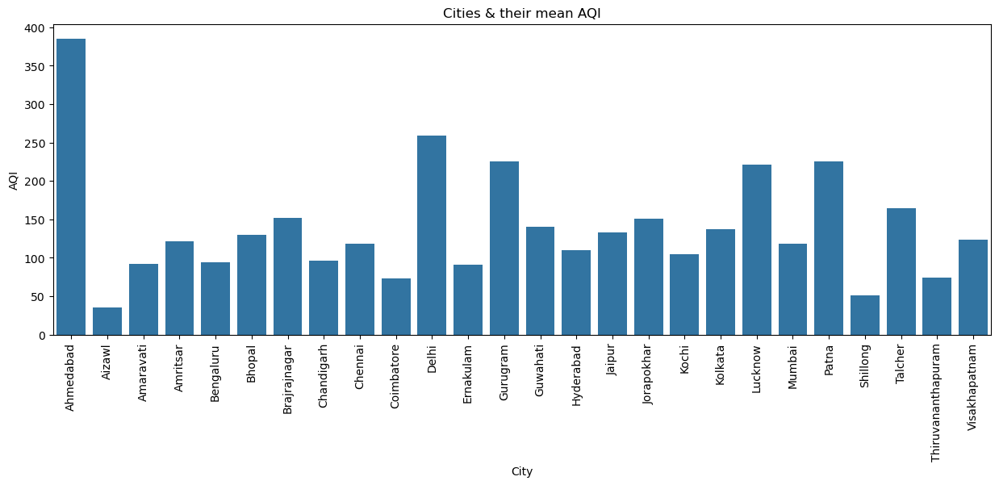

In [39]:
plt.figure(figsize=(15,5))
sns.barplot(x='city', y='aqi', data=city_wise_aqi).set(title ='Cities & their mean AQI')
plt.ylabel('AQI')
plt.xlabel('City')
plt.xticks(rotation=90)
plt.show()

### Observation:
> Ahemdabad has the highest AQI mean, followed by Delhi.<br>
> Aizawl has the lowest AQI mean, followed by Shillong.<br>

## Cities AQI by years

In [40]:
city_year_aqi = city_df[['city','aqi', 'year']].groupby(['city', 'year']).mean().sort_values(['aqi']).reset_index()

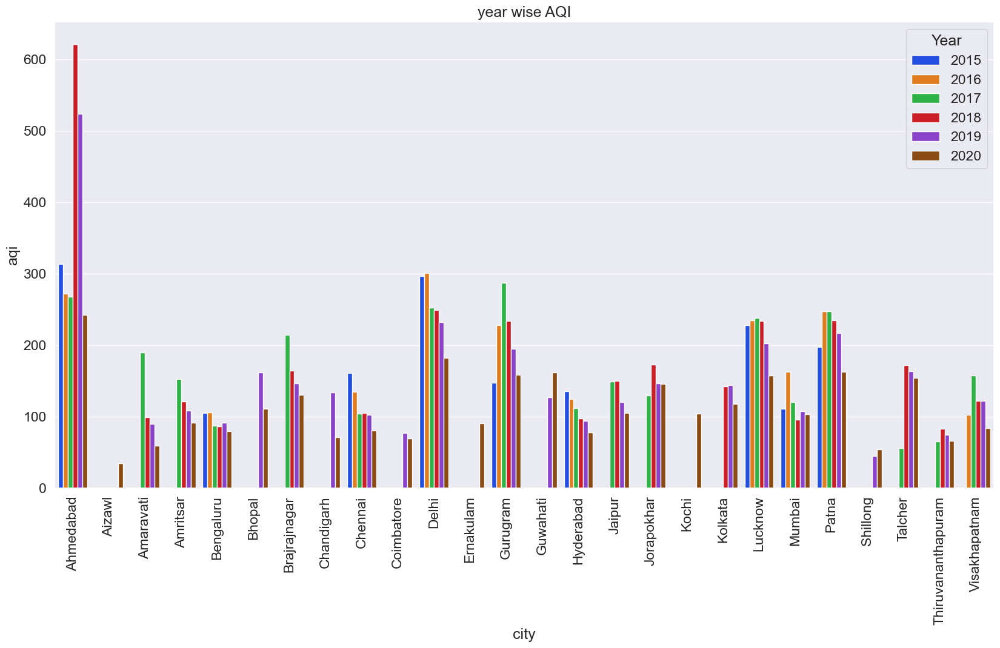

In [41]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1.5)
sns.barplot(x='city', y='aqi', data=city_year_aqi,hue='year',palette='bright').set(title ='year wise AQI')
plt.xticks(rotation=90)
plt.legend(loc='upper right', title='Year')
plt.show()

### Observations:
> Aizawl, Ernakulam, Kochi have data only for 2020.<br>
> Shillong, Coimbatore, Chandigarh, Bhopal, Guwahati have only data for 2019 and 2020.<br>
> Ahemdabad's 2018 AQI mean is the peak.<br>

## Cities AQI by months

In [42]:
city_month_aqi = city_df.groupby(['city', 'month'])['aqi'].mean().reset_index()

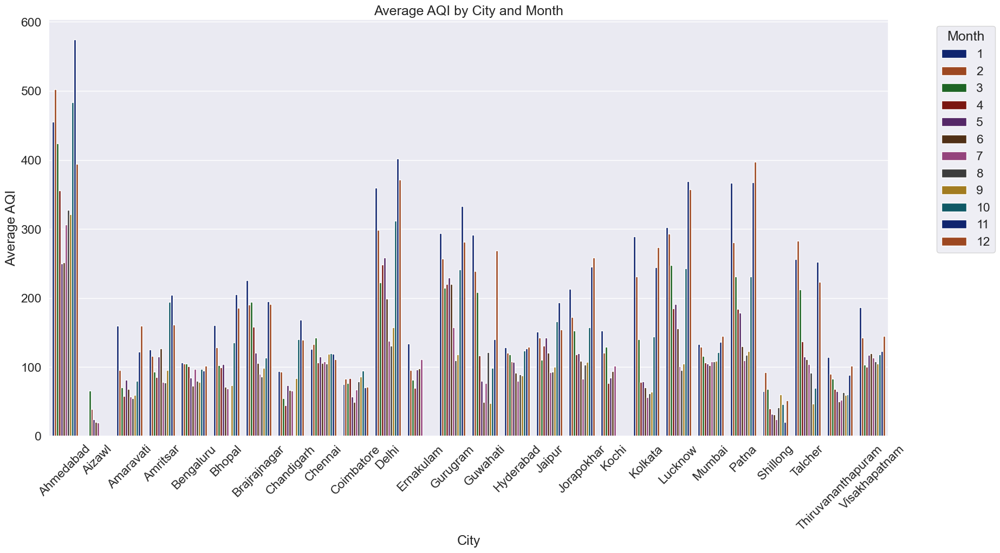

In [43]:
plt.figure(figsize=(20, 10))

sns.barplot(x='city', y='aqi', hue='month', data=city_month_aqi, palette='dark')
plt.title('Average AQI by City and Month')
plt.xlabel('City')
plt.ylabel('Average AQI')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()

### Observation:
> For almost each city, either the starting months or the ending months have high AQI.

## Pre Vs During Covid

In [44]:
post_19 = city_df[city_df['date'] > '2020-03-22']
post_19.info()

<class 'pandas.core.frame.DataFrame'>
Index: 62426 entries, 45791 to 707874
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   city         62426 non-null  category      
 1   pm2.5        62426 non-null  float64       
 2   no2          62426 non-null  float64       
 3   nh3          62426 non-null  float64       
 4   co           62426 non-null  float64       
 5   so2          62426 non-null  float64       
 6   o3           62426 non-null  float64       
 7   benzene      62426 non-null  float64       
 8   toluene      62426 non-null  float64       
 9   xylene       62426 non-null  float64       
 10  aqi          62426 non-null  float64       
 11  air_quality  62426 non-null  category      
 12  date         62426 non-null  datetime64[ns]
 13  month        62426 non-null  int32         
 14  year         62426 non-null  int32         
 15  hour         62426 non-null  int32         
dtypes: c

In [45]:
pre_19 = city_df[city_df['date'] <'2020-03-22']
pre_19.info()

<class 'pandas.core.frame.DataFrame'>
Index: 644825 entries, 0 to 705449
Data columns (total 16 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   city         644825 non-null  category      
 1   pm2.5        644825 non-null  float64       
 2   no2          644825 non-null  float64       
 3   nh3          644825 non-null  float64       
 4   co           644825 non-null  float64       
 5   so2          644825 non-null  float64       
 6   o3           644825 non-null  float64       
 7   benzene      644825 non-null  float64       
 8   toluene      644825 non-null  float64       
 9   xylene       644825 non-null  float64       
 10  aqi          644825 non-null  float64       
 11  air_quality  644825 non-null  category      
 12  date         644825 non-null  datetime64[ns]
 13  month        644825 non-null  int32         
 14  year         644825 non-null  int32         
 15  hour         644825 non-null  int32    

<Figure size 1200x600 with 0 Axes>

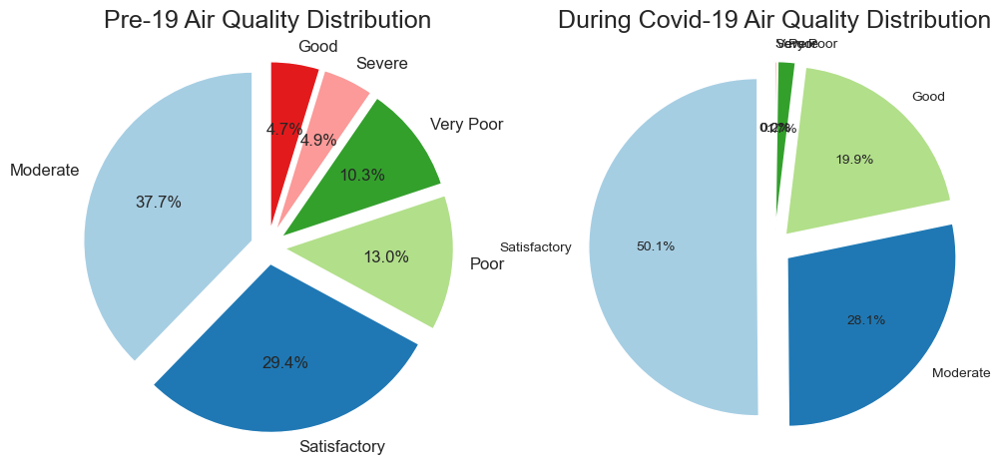

In [46]:
pre_air_quality_counts = pre_19['air_quality'].value_counts()
post_air_quality_counts = post_19['air_quality'].value_counts()

plt.figure(figsize=(12, 6))
explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1)

# Plot for pre_19
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.pie(pre_air_quality_counts, labels=pre_air_quality_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors, explode=explode, textprops={'fontsize': 12} )
plt.title('Pre-19 Air Quality Distribution')

# Plot for post_19
plt.subplot(1, 2, 2)
plt.pie(post_air_quality_counts, labels=post_air_quality_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors, explode=explode,  textprops={'fontsize': 10} )
plt.title('During Covid-19 Air Quality Distribution')

plt.show()

### Observations:
> Satisfactory + Moderate air quality in pre-covid era was 67%.<br>
> During Covid lockdown satisfactory air quality alone is 50.1%, satisfactory + moderate air quality was 76.2%.

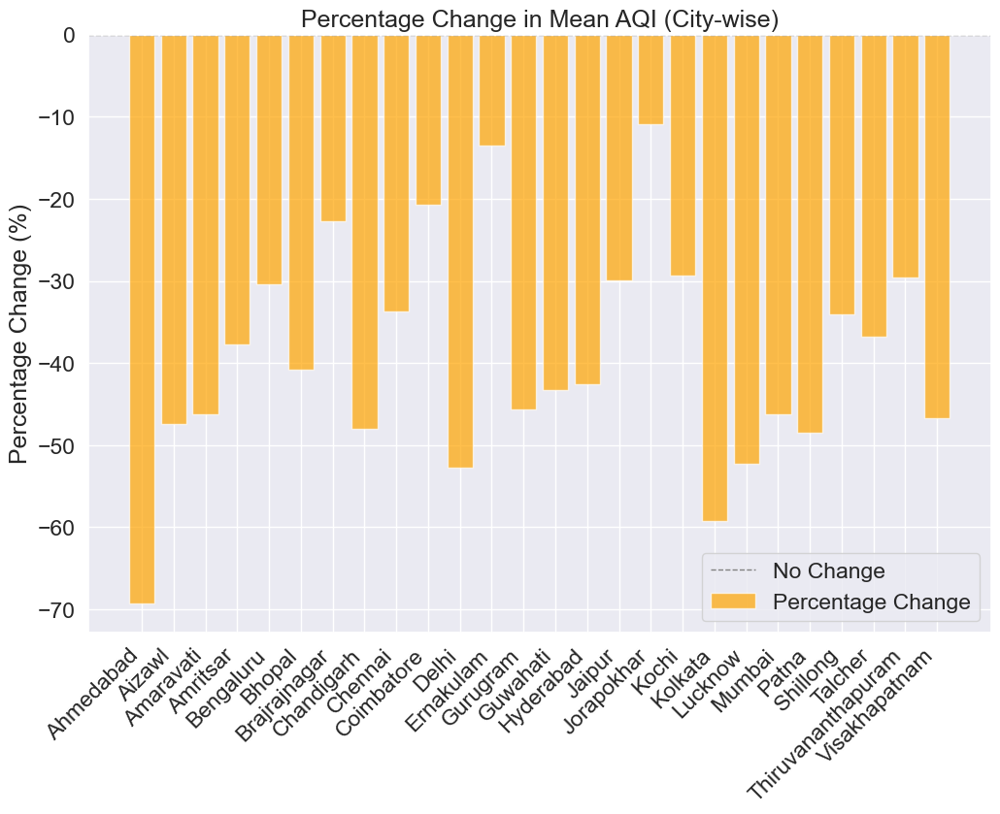

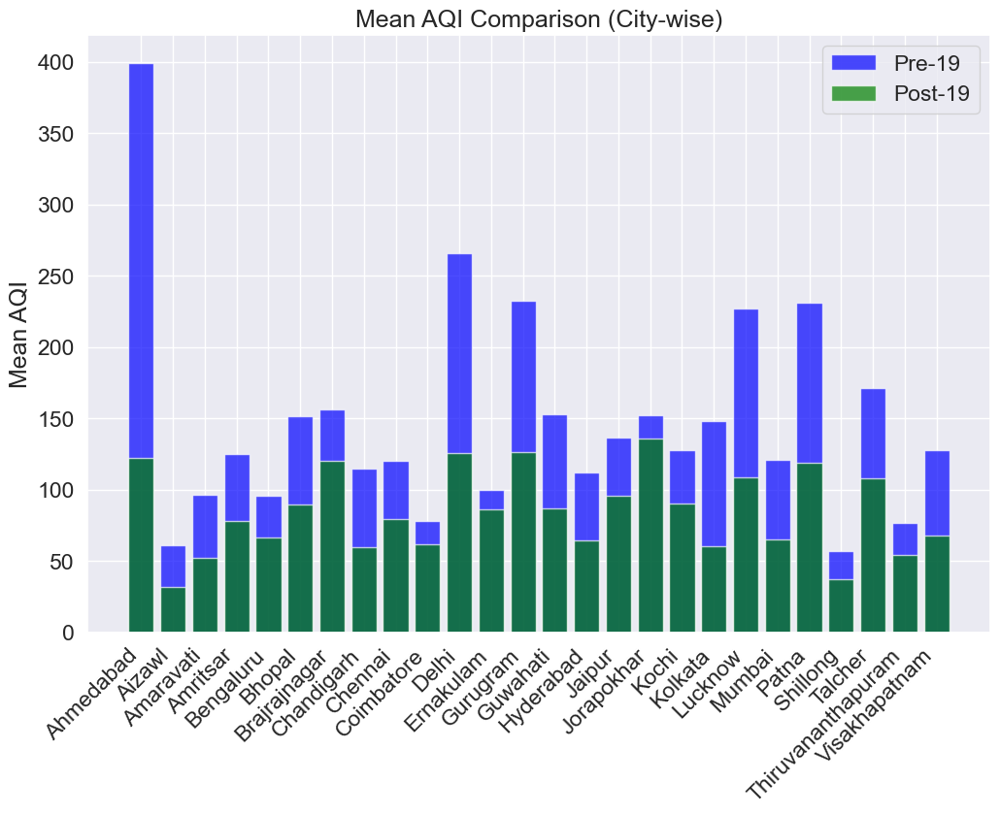

In [47]:
pre_aqi_mean = pre_19.groupby('city')['aqi'].mean()
post_aqi_mean = post_19.groupby('city')['aqi'].mean()

# Calculate percentage change
percentage_change = ((post_aqi_mean - pre_aqi_mean) / pre_aqi_mean) * 100

# Bar chart for percentage change
plt.figure(figsize=(12, 8))
plt.bar(percentage_change.index, percentage_change, color='orange', alpha=0.7, label='Percentage Change')

plt.title('Percentage Change in Mean AQI (City-wise)')
plt.ylabel('Percentage Change (%)')
plt.xticks(rotation=45, ha='right')
plt.axhline(0, color='gray', linestyle='--', linewidth=1, label='No Change')
plt.legend()
plt.show()

# Bar Chart for AQI mean values pre and post
plt.figure(figsize=(12, 8))
plt.bar(pre_aqi_mean.index, pre_aqi_mean, color='blue', alpha=0.7, label='Pre-19')
plt.bar(post_aqi_mean.index , post_aqi_mean, color='green', alpha=0.7, label='Post-19')

plt.title('Mean AQI Comparison (City-wise)')
plt.ylabel('Mean AQI')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.show()


### Observations:
> Ahemdabad shown the most change around 70% decrease in AQI value.<br>
> Least change in AQI value shown by Jorakhpur.

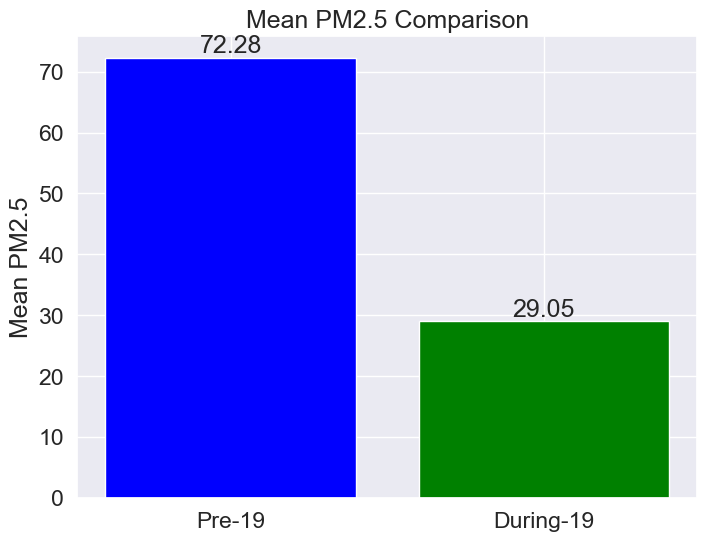

In [48]:
pre_mean = pre_19['pm2.5'].mean()
post_mean = post_19['pm2.5'].mean()

plt.figure(figsize=(8, 6))
bars=plt.bar(['Pre-19', 'During-19'], [pre_mean, post_mean], color=['blue', 'green'])
plt.title('Mean PM2.5 Comparison')
plt.ylabel('Mean PM2.5')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

### Observation:
> PM2.5 has a very significant decrease (~60%) during covid.

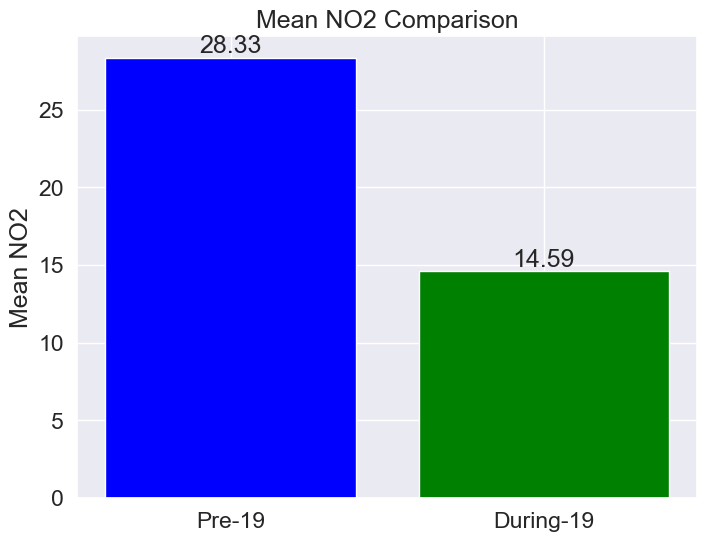

In [49]:
pre_mean = pre_19['no2'].mean()
post_mean = post_19['no2'].mean()

plt.figure(figsize=(8, 6))
bars=plt.bar(['Pre-19', 'During-19'], [pre_mean, post_mean], color=['blue', 'green'])
plt.title('Mean NO2 Comparison')
plt.ylabel('Mean NO2')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

### Observation:
> NO2 shown around 50% decrease.

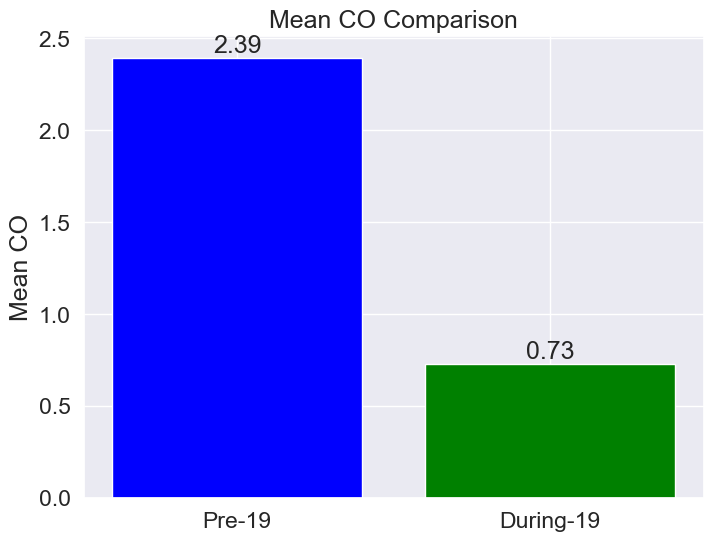

In [50]:
pre_mean = pre_19['co'].mean()
post_mean = post_19['co'].mean()

plt.figure(figsize=(8, 6))
bars=plt.bar(['Pre-19', 'During-19'], [pre_mean, post_mean], color=['blue', 'green'])
plt.title('Mean CO Comparison')
plt.ylabel('Mean CO')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

### Observation:
> CO shown 70% decrease.

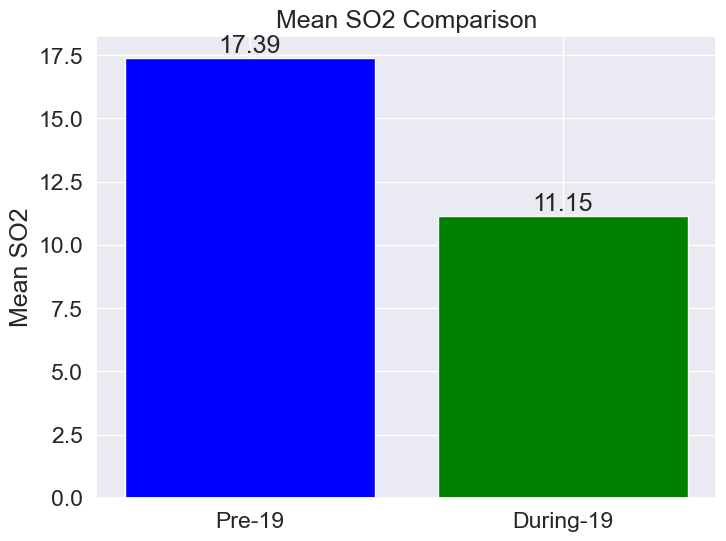

In [51]:
pre_mean = pre_19['so2'].mean()
post_mean = post_19['so2'].mean()

plt.figure(figsize=(8, 6))
bars=plt.bar(['Pre-19', 'During-19'], [pre_mean, post_mean], color=['blue', 'green'])
plt.title('Mean SO2 Comparison')
plt.ylabel('Mean SO2')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

### Observation:
> 41% Decrease in SO2.

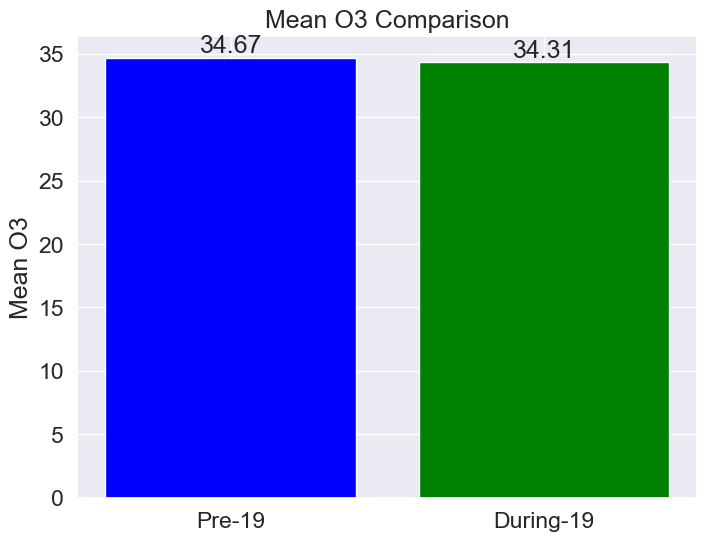

In [52]:
pre_mean = pre_19['o3'].mean()
post_mean = post_19['o3'].mean()

plt.figure(figsize=(8, 6))
bars=plt.bar(['Pre-19', 'During-19'], [pre_mean, post_mean], color=['blue', 'green'])
plt.title('Mean O3 Comparison')
plt.ylabel('Mean O3')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

### Observation: (Interesting)
> No difference in the level of O3

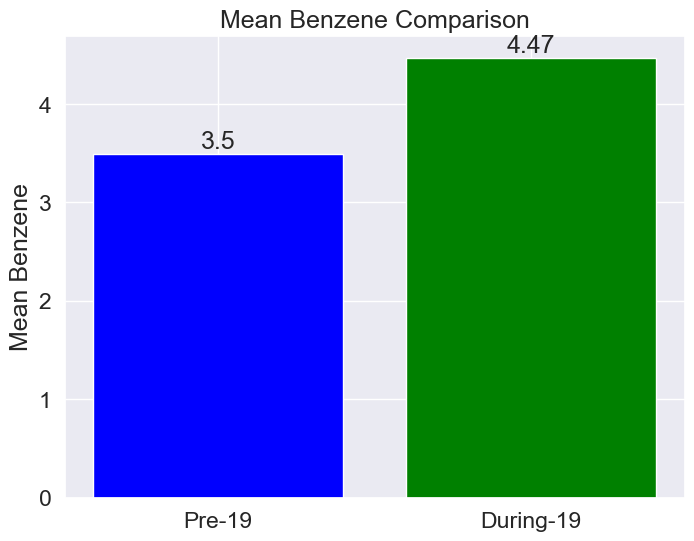

In [53]:
pre_mean = pre_19['benzene'].mean()
post_mean = post_19['benzene'].mean()

plt.figure(figsize=(8, 6))
bars=plt.bar(['Pre-19', 'During-19'], [pre_mean, post_mean], color=['blue', 'green'])
plt.title('Mean Benzene Comparison')
plt.ylabel('Mean Benzene')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

### Observation: (Interesting)
> Negative effect, benzene levels increased during covid.

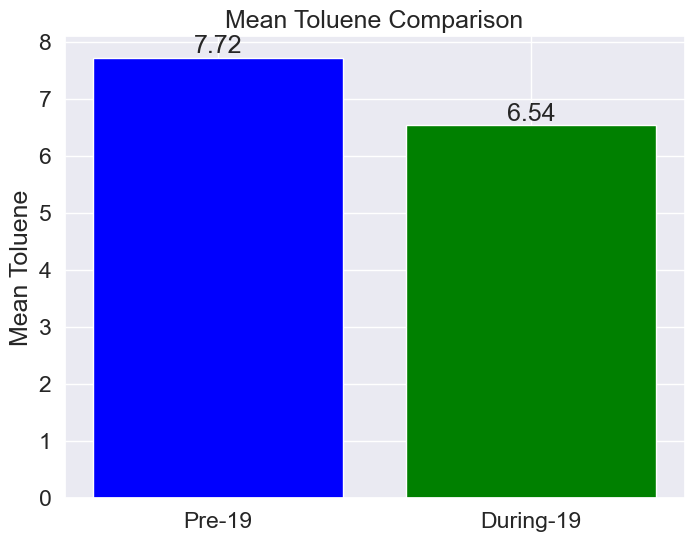

In [54]:
pre_mean = pre_19['toluene'].mean()
post_mean = post_19['toluene'].mean()

plt.figure(figsize=(8, 6))
bars=plt.bar(['Pre-19', 'During-19'], [pre_mean, post_mean], color=['blue', 'green'])
plt.title('Mean Toluene Comparison')
plt.ylabel('Mean Toluene')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

### Observation:
> 15 % decrease in Toluene levels.

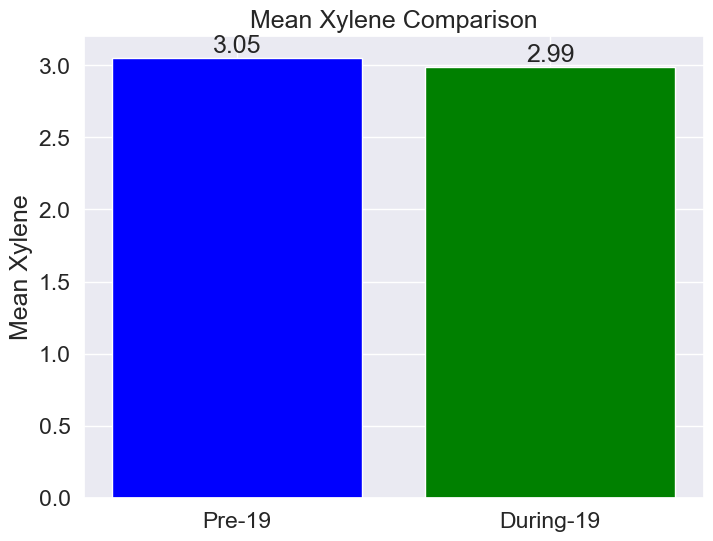

In [55]:
pre_mean = pre_19['xylene'].mean()
post_mean = post_19['xylene'].mean()

plt.figure(figsize=(8, 6))
bars=plt.bar(['Pre-19', 'During-19'], [pre_mean, post_mean], color=['blue', 'green'])
plt.title('Mean Xylene Comparison')
plt.ylabel('Mean Xylene')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.show()

### Observation:
> 0.01% decrease in Xylene Levels.

## WeekDays and Weekends

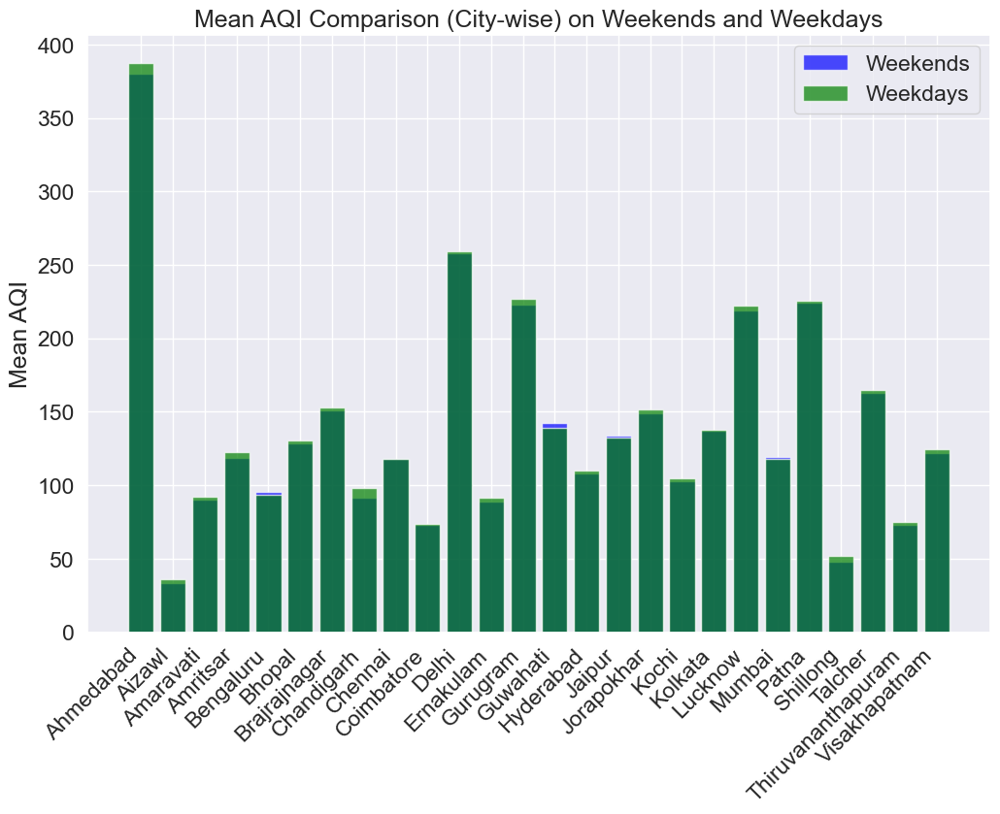

In [56]:
# Create a new column 'is_weekend' based on whether the date is a Saturday or Sunday
city_df['is_weekend'] = city_df['date'].dt.dayofweek.isin([5, 6])

weekend_df = city_df[city_df['is_weekend']]
weekday_df = city_df[~city_df['is_weekend']]

# Calculate mean AQI values city-wise
mean_aqi_weekend = weekend_df.groupby(['city'])['aqi'].mean().reset_index()
mean_aqi_weekday = weekday_df.groupby(['city'])['aqi'].mean().reset_index()

plt.figure(figsize=(12, 8))

# Plotting mean AQI 
plt.bar(mean_aqi_weekend['city'], mean_aqi_weekend['aqi'], color='blue', alpha=0.7, label='Weekends')
plt.bar(mean_aqi_weekday['city'], mean_aqi_weekday['aqi'], color='green', alpha=0.7, label='Weekdays')

plt.title('Mean AQI Comparison (City-wise) on Weekends and Weekdays')
plt.ylabel('Mean AQI')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.show()


### Observation:
> There is no much difference in AQI values for weekends and weekdays.<br>
> Still for most of the cities weekdays AQI is slightly higher.

## Pollutants Vs Year

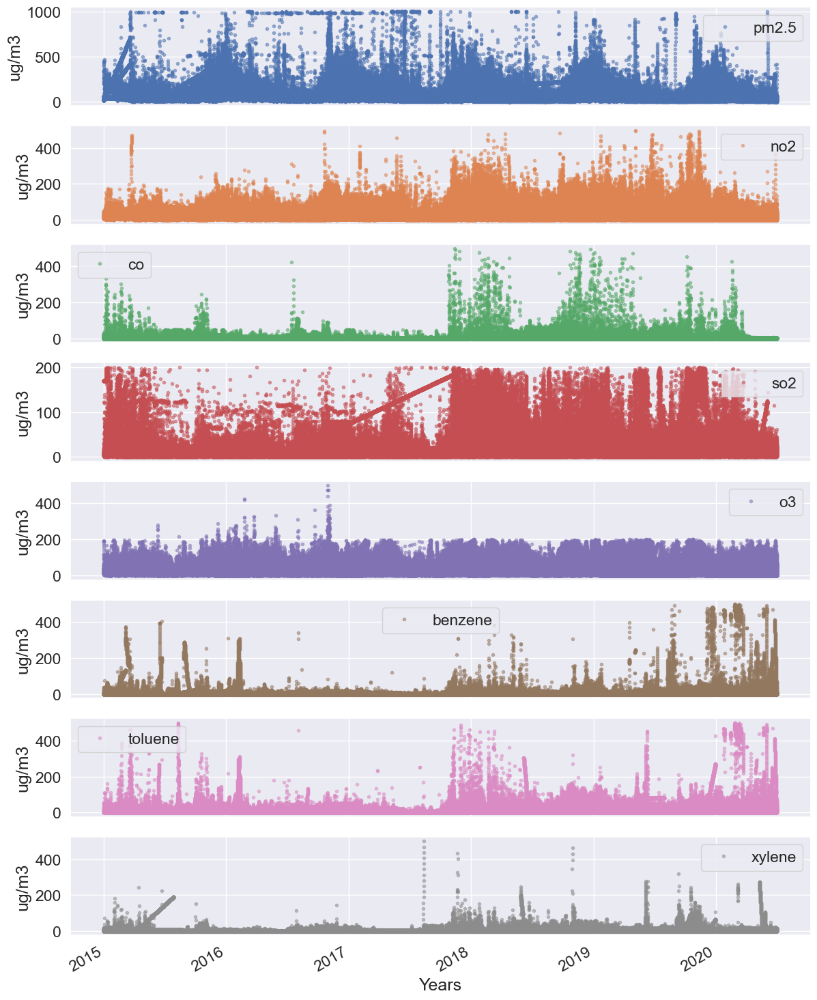

In [57]:
pollutants = ['pm2.5', 'no2', 'co', 'so2', 'o3', 'benzene', 'toluene','xylene']
axes = city_df.set_index('date')[pollutants].plot(marker='.', alpha=0.5, linestyle='None', figsize=(14, 20), subplots=True)

for ax in axes:
    ax.set_xlabel('Years')
    ax.set_ylabel('ug/m3')

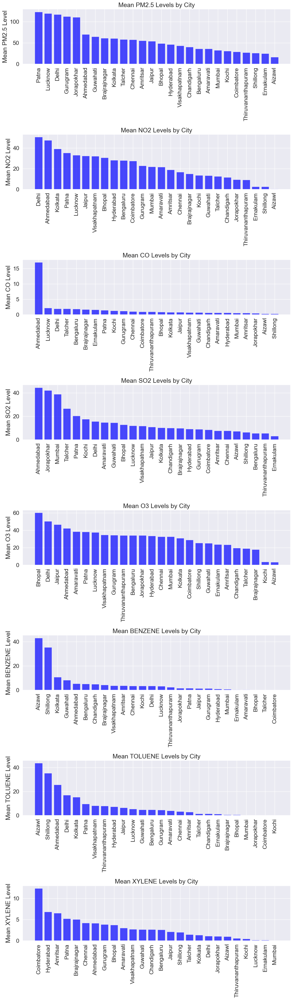

In [58]:
# Create subplots
fig, axes = plt.subplots(nrows=len(pollutants), ncols=1, figsize=(12, 5 * len(pollutants)))

# Plot each pollutant in a subplot
for i, pollutant in enumerate(pollutants):
    pollutant_mean = city_df.groupby('city')[pollutant].mean().sort_values(ascending=False)
    
    axes[i].bar(pollutant_mean.index, pollutant_mean, color='blue', alpha=0.7)
    axes[i].set_title(f'Mean {(pollutant).upper()} Levels by City')
    axes[i].set_ylabel(f'Mean {pollutant.upper()} Level')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


### In the course of outlier detection within our dataset, it has come to our attention that certain Air Quality Index (AQI) values surpass the conventional upper limit of 500, extending up to 3200. It is imperative to acknowledge that the AQI is derived from pollutant levels, and modifying outlier values may inadvertently compromise the integrity of subsequent calculations.<br> <br>While recognizing the potential for outliers to be indicative of genuine instances of extreme pollution events, a cautious approach has been taken in the analysis. It is presumed, for the sake of data robustness, that anomalies in AQI values may stem from either inaccuracies in data collection procedures or potential sensor malfunctions. This acknowledgment informs our analytical stance, steering clear of undue alterations that could disproportionately influence the dataset's overall coherence. 
## If you have any insights or recommendations on handling such outliers, your input would be invaluable in refining our data interpretation. 
# --------------------------------------------------------------------------------------------------------------

# Machine Learning
### If you have access to the pollutant levels and the formula or method for calculating AQI, you can directly compute the AQI without the need for a machine learning model. The AQI is a standardized index calculated based on specific concentrations of pollutants, and its computation follows a defined formula.<br><br>In such cases, a machine learning model might not be necessary if the goal is solely to compute the AQI from known pollutant levels. Machine learning models are typically valuable when there's a need to make predictions or classifications based on patterns in the data, especially when those patterns might be complex or not easily expressed through a straightforward formula.<br><br>So, if your primary objective is to calculate AQI based on pollutant levels, using the established formula or method is a more direct and accurate approach. Machine learning models become more relevant when there's a need to predict AQI values in situations where you might not have direct measurements of all pollutants or want to consider additional features that impact air quality.

# -----------------------------------------------------------------------------------------------------------------

# Delhi Analysis

In [59]:
df=city_df[city_df['city']=='Delhi']

In [60]:
df.reset_index(inplace=True,drop=True)

In [61]:
df.head()

,city,pm2.5,no2,nh3,co,so2,o3,benzene,toluene,xylene,aqi,air_quality,date,month,year,hour,is_weekend
0,Delhi,454.58,41.78,27.54,9.29,3.41,54.94,25.24,58.57,13.80,192.250000,Moderate,2015-01-01,1,2015,1,False
1,Delhi,440.44,43.46,27.72,13.28,3.88,50.53,23.10,49.37,15.63,209.833333,Poor,2015-01-01,1,2015,2,False
2,Delhi,409.09,41.19,28.94,29.67,2.83,19.33,19.04,38.94,17.18,227.416667,Poor,2015-01-01,1,2015,3,False
3,Delhi,436.12,39.55,29.30,21.76,4.33,20.08,13.99,27.53,16.82,245.000000,Poor,2015-01-01,1,2015,4,False
4,Delhi,415.88,37.41,30.84,26.19,6.17,16.00,11.14,21.99,14.29,262.583333,Poor,2015-01-01,1,2015,5,False


In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48192 entries, 0 to 48191
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   city         48192 non-null  category      
 1   pm2.5        48192 non-null  float64       
 2   no2          48192 non-null  float64       
 3   nh3          48192 non-null  float64       
 4   co           48192 non-null  float64       
 5   so2          48192 non-null  float64       
 6   o3           48192 non-null  float64       
 7   benzene      48192 non-null  float64       
 8   toluene      48192 non-null  float64       
 9   xylene       48192 non-null  float64       
 10  aqi          48192 non-null  float64       
 11  air_quality  48192 non-null  category      
 12  date         48192 non-null  datetime64[ns]
 13  month        48192 non-null  int32         
 14  year         48192 non-null  int32         
 15  hour         48192 non-null  int32         
 16  is_w

In [63]:
# Filter data for pre-covid 2019, pre-covid 2020, and post-covid 2020
pre_covid = df[(df['date'] < '2020-03-22')]
post_covid_2020 = df[df['date'] >= '2020-03-22']

# Create line plots
fig = px.line(pre_covid, x='date', y='aqi', title='AQI Levels Over Time')
fig.add_trace(px.line(post_covid_2020, x='date', y='aqi').data[0])

# Add a straight vertical line on 22-03-2020
fig.add_shape(dict(type="line", x0="2020-03-22", x1="2020-03-22", y0=0, y1=800, line=dict(color="red", width=2)))

# Show the plot
fig.update_layout(xaxis_title="Date", yaxis_title="AQI")
fig.show()


### Observation:
> Some days in July and August 2017 were the best days for Delhiites in terms of air.<br>
> “Even though it is not raining in Delhi all the time this monsoon, surrounding areas across north India have received substantial rain. Because of this, long range transport of pollutants from outside Delhi is minimal. Around 20%-30% pollution gets reduced because of this,” the official said. Article: <a href='https://www.hindustantimes.com/delhi-news/delhi-s-air-cleanest-in-last-27-months-shows-cpcb-aqi-data/story-MGp1IlfMKJz4Myr4OWrbuK.html'>Link</a><br>
> The least AQI ever achieved is 22 in July 2017.<br>
> During Covid there has been simultaneous decrease in AQI once but it is not much significant that Delhi has never seen.

# April, May and June of 2019 Vs 2020

In [64]:
df_2015 = df[(df['date'] > '2015-03-31') & (df['date'] < '2015-07-01')]
df_2016 = df[(df['date'] > '2016-03-31') & (df['date'] < '2016-07-01')]
df_2017 = df[(df['date'] > '2017-03-31') & (df['date'] < '2017-07-01')]
df_2018 = df[(df['date'] > '2018-03-31') & (df['date'] < '2018-07-01')]
df_2019 = df[(df['date'] > '2019-03-31') & (df['date'] < '2019-07-01')]
df_2020 = df[(df['date'] > '2020-03-31') & (df['date'] < '2020-07-01')]


In [65]:
df_2015

,city,pm2.5,no2,nh3,co,so2,o3,benzene,toluene,xylene,aqi,air_quality,date,month,year,hour,is_weekend
2159,Delhi,73.39,25.58,58.60,7.66,8.86,65.19,6.94,18.71,2.600000,234.0,Poor,2015-04-01,4,2015,0,False
2160,Delhi,70.65,28.40,64.12,9.71,9.19,77.83,5.89,15.70,2.380000,224.0,Poor,2015-04-01,4,2015,1,False
2161,Delhi,77.50,34.78,51.50,13.95,10.68,56.11,5.36,13.56,2.170000,266.0,Poor,2015-04-01,4,2015,2,False
2162,Delhi,112.22,42.26,48.78,12.83,14.52,47.71,5.42,12.91,2.280000,283.0,Poor,2015-04-01,4,2015,3,False
2163,Delhi,125.32,43.42,47.91,15.31,17.03,34.03,5.70,13.12,2.230000,292.0,Poor,2015-04-01,4,2015,4,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4338,Delhi,80.71,56.02,45.50,1.22,8.28,70.82,1.05,6.15,2.852209,178.0,Moderate,2015-06-30,6,2015,19,False
4339,Delhi,77.82,63.47,44.07,1.34,9.61,59.34,1.34,6.08,2.852589,181.0,Moderate,2015-06-30,6,2015,20,False
4340,Delhi,77.04,60.12,40.89,1.32,9.16,49.87,1.31,6.89,2.852969,183.0,Moderate,2015-06-30,6,2015,21,False
4341,Delhi,56.56,55.35,48.10,1.25,9.74,47.68,1.36,9.68,2.853349,184.0,Moderate,2015-06-30,6,2015,22,False


In [66]:
df_2015.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2184 entries, 2159 to 4342
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   city         2184 non-null   category      
 1   pm2.5        2184 non-null   float64       
 2   no2          2184 non-null   float64       
 3   nh3          2184 non-null   float64       
 4   co           2184 non-null   float64       
 5   so2          2184 non-null   float64       
 6   o3           2184 non-null   float64       
 7   benzene      2184 non-null   float64       
 8   toluene      2184 non-null   float64       
 9   xylene       2184 non-null   float64       
 10  aqi          2184 non-null   float64       
 11  air_quality  2184 non-null   category      
 12  date         2184 non-null   datetime64[ns]
 13  month        2184 non-null   int32         
 14  year         2184 non-null   int32         
 15  hour         2184 non-null   int32         
 16  is_weeke

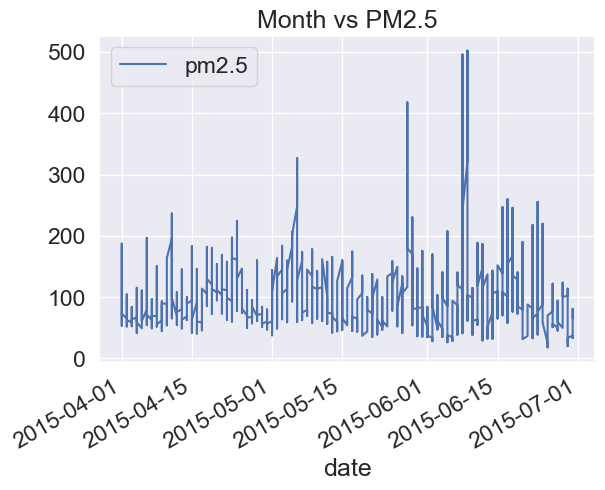

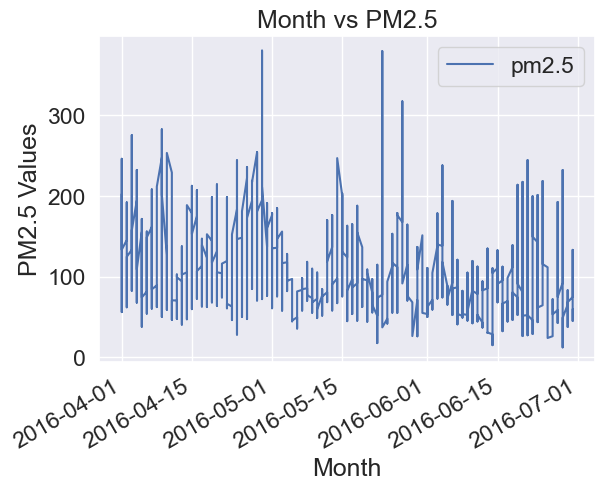

In [67]:
import matplotlib.pyplot as plt

# Assuming df_2015 is your DataFrame
df_2015.plot(x='date', y='pm2.5', kind='line', title='Month vs PM2.5')
df_2016.plot(x='date', y='pm2.5', kind='line', title='Month vs PM2.5')

plt.xlabel('Month')
plt.ylabel('PM2.5 Values')
plt.show()
